In [47]:
#from shapely.geometry import Point
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from haversine import haversine
from datetime import datetime
import seaborn as sns
import matplotlib
from matplotlib.pyplot import figure
#import geopandas as gpd
#from geopandas import GeoDataFrame
from matplotlib.dates import DateFormatter
from matplotlib.lines import Line2D

In [48]:
df = pd.read_csv(r'../../data/tidy/large/vehicle-locations-Apr2022.csv', delimiter=',', skiprows=0, low_memory=False)

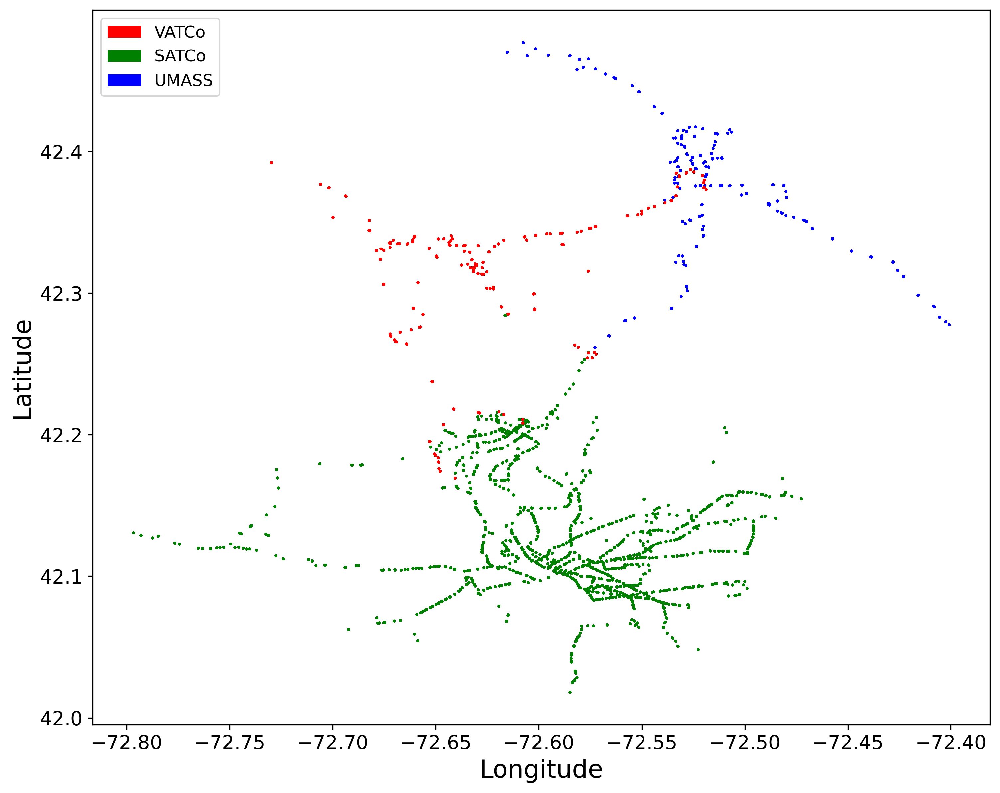

In [49]:
plt.figure(figsize=(10, 8), dpi=300)
colors = {'VATCo':'red', 'SATCo':'green', 'UMASS':'blue'}
plt.scatter(x=df['Lon'], y=df['Lat'], c= df['Operator'].map(colors), s=1)
plt.xlabel("Longitude", fontsize=18)
plt.ylabel("Latitude", fontsize=18)

circ1 = mpatches.Patch(facecolor='red',label='VATCo')
circ2= mpatches.Patch(facecolor='green',label='SATCo')
circ3 = mpatches.Patch(facecolor='blue',label='UMASS')

plt.legend(handles = [circ1,circ2,circ3],loc=2,fontsize=12)
plt.tight_layout()
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)

plt.savefig(r'../../figures/operators-stops.png', dpi=400, bbox_inches='tight')
plt.show()

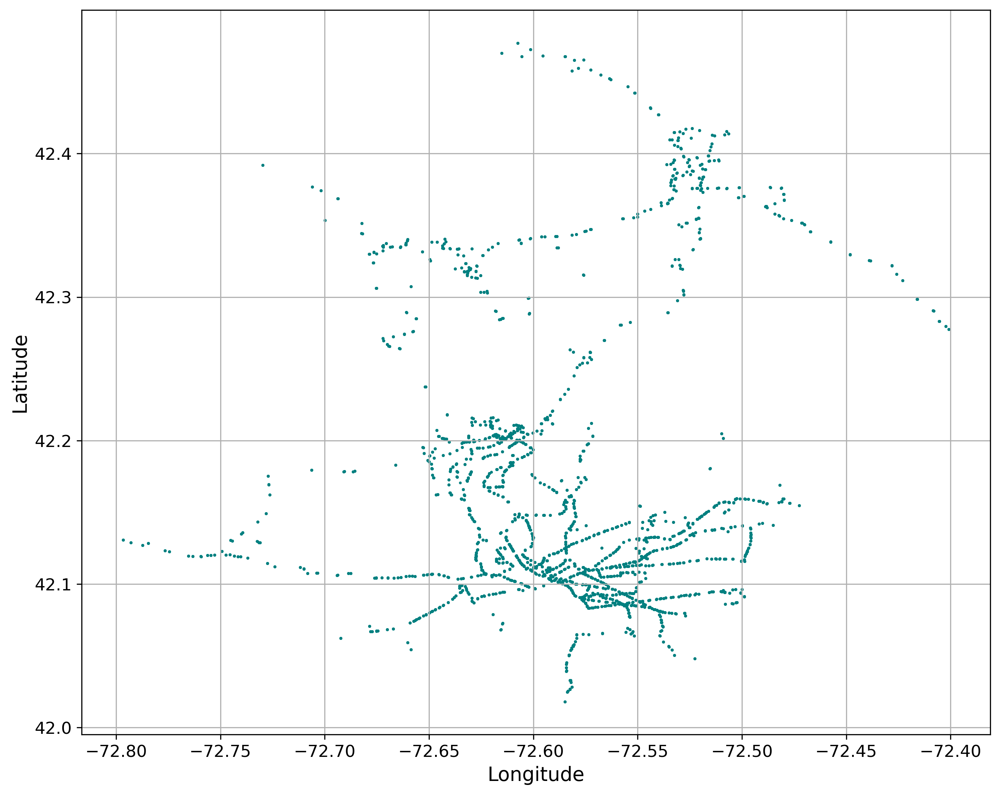

In [50]:
# ver02
plt.figure(figsize=(10, 8), dpi=300)
plt.scatter(x=df['Lon'], y=df['Lat'], s=1, color="teal")
plt.xlabel("Longitude", fontsize=14)
plt.ylabel("Latitude", fontsize=14)

circ1 = mpatches.Patch(facecolor='red',label='VATCo')
circ2= mpatches.Patch(facecolor='green',label='SATCo')
circ3 = mpatches.Patch(facecolor='blue',label='UMASS')

#plt.legend(handles = [circ1,circ2,circ3],loc=2,fontsize=12)
plt.tight_layout()
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.grid()

plt.savefig(r'../../figures/operators-stops.png', dpi=400, bbox_inches='tight')
plt.show()

In [51]:
len(df.Vehicle.unique())

178

In [52]:
#vehicles=df.Vehicle.unique()

In [53]:
df.sort_values(by=['Vehicle','ServiceDateTime'], ascending=True, inplace=True)

In [54]:
df[["Vehicle", "ServiceDateTime"]].head(1000)


,Vehicle,ServiceDateTime
0,1205,2022-04-04 06:43:24
1,1205,2022-04-04 06:51:27
2,1205,2022-04-04 06:51:27
3,1205,2022-04-04 06:52:52
4,1205,2022-04-04 06:54:33
...,...,...
995,1205,2022-04-13 14:44:34
996,1205,2022-04-13 14:48:53
997,1205,2022-04-13 14:50:19
998,1205,2022-04-13 14:51:45


In [55]:
df['ServiceDateTime']= pd.to_datetime(df['ServiceDateTime'])

In [56]:
df[["Vehicle", "ServiceDateTime"]].head(1000)

,Vehicle,ServiceDateTime
0,1205,2022-04-04 06:43:24
1,1205,2022-04-04 06:51:27
2,1205,2022-04-04 06:51:27
3,1205,2022-04-04 06:52:52
4,1205,2022-04-04 06:54:33
...,...,...
995,1205,2022-04-13 14:44:34
996,1205,2022-04-13 14:48:53
997,1205,2022-04-13 14:50:19
998,1205,2022-04-13 14:51:45


In [57]:
df['time_delta'] = df.groupby(['Vehicle', 'Date'])['ServiceDateTime'].diff()

In [58]:
df.time_delta=df.time_delta.astype(str).str.replace('0 days ', '')

In [59]:
df['time_delta']= pd.to_datetime(df['time_delta'])

In [60]:
df['time_delta_in_seconds'] = df['time_delta'].dt.hour * 3600 + df['time_delta'].dt.minute * 60 + df['time_delta'].dt.second

In [61]:
#46765 data points with time intervals less than 2 sec are filtered 
#df

In [62]:
#calculating distances by unique vehicle Id and unique day
dist=[]
for i in df.index:
    if i==0:
        dist.append(0) 
    else:
        if df['Vehicle'].loc[i]==df['Vehicle'].loc[i-1]:
            if df['Date'].loc[i]==df['Date'].loc[i-1]:           
                coordinate_x = (df['Lon'].loc[i] ,df['Lat'].loc[i]) # (lat, lon) for x
                coordinate_x_minus_1 = (df['Lon'].loc[i-1] ,df['Lat'].loc[i-1]) #(lat, lon) for x-1
                distance=haversine(coordinate_x_minus_1, coordinate_x, unit='mi')
                dist.append(distance) 
            else:
                #dist.append('nan')
                dist.append(0) 
        else:   
            #dist.append('nan')
            dist.append(0) 
df['dist'] = dist
#df.to_csv(r'../../results/computed-distances.csv')

In [63]:
#calculating speed by unique vehicle Id and unique day
speed=[]
for i in df.index:
    if i==0 or i==1:
        speed.append(0) 
    else:
        if df['Vehicle'].loc[i]==df['Vehicle'].loc[i-1]:
            if df['Date'].loc[i]==df['Date'].loc[i-1]:
                FMT = '%H:%M:%S'
                time_diff = abs(datetime.strptime(df['time'].loc[i-1], FMT) - datetime.strptime(df['time'].loc[i], FMT)).total_seconds() / 3600.0
                distance = df['dist'].loc[i]
                if time_diff==0:
                    speed.append(0)
                else:
                    speed_current=distance/time_diff
                    speed.append(speed_current) 
                    #if speed_current>=90:
                        #speed.append(90) 
                    #else:    
                        #speed.append(speed_current)
            else:
                #speed.append('nan')
                speed.append(0) 
        else:   
            #speed.append('nan')
            speed.append(0) 
df['speed'] = speed
#df.to_csv(r'../../results/computed-speeds.csv')

In [64]:
#calculating acceleration by unique vehicle Id and unique day
acc=[]
for i in df.index:
    if i==0 or i==1 or i==2:
        acc.append(0) 
    else:
        if df['Vehicle'].loc[i]==df['Vehicle'].loc[i-1]:
            if df['Date'].loc[i]==df['Date'].loc[i-1]:
                FMT = '%H:%M:%S'
                time_diff = abs(datetime.strptime(df['time'].loc[i-1], FMT) - datetime.strptime(df['time'].loc[i], FMT)).total_seconds() / 3600.0
                #if df['speed'].loc[i-1]=='nan':
                #    df['speed'].loc[i-1]==0
                #else:
                #    pass
                speed_diff = df['speed'].loc[i] - df['speed'].loc[i-1]
                if time_diff==0:
                    acc.append(0) 
                else:
                    acc_current=(speed_diff/time_diff)*0.00012417777777778 # 1 miles/h2 = 0.00012417777777778 m/s2
                    #if -5<acc_current<5:
                    #    acc.append(acc_current)
                    #else:
                    #    acc.append(0)
                    acc.append(acc_current)
            else:
                #acc.append('nan')
                acc.append(0) 
        else:   
            #acc.append('nan')
            acc.append(0) 
df['acc'] = acc
#df.to_csv(r'../../results/computed-trajectories2.csv')

In [65]:
# Make a copy of df with calculated trajectories
df_copy=df.copy()

In [66]:
df_copy

,ServiceDateTime,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
0,2022-04-04 06:43:24,112564,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,43,24,2022-04-04,Weekday,06:43:24,NaT,NaN,0.000000,0.000000,0.000000
1,2022-04-04 06:51:27,109326,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,51,27,2022-04-04,Weekday,06:51:27,2023-02-13 00:08:03,483.0,0.627342,0.000000,0.000000
2,2022-04-04 06:51:27,112565,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,51,27,2022-04-04,Weekday,06:51:27,2023-02-13 00:00:00,0.0,0.000000,0.000000,0.000000
3,2022-04-04 06:52:52,109327,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,52,52,2022-04-04,Weekday,06:52:52,2023-02-13 00:01:25,85.0,0.313431,13.274729,0.069816
4,2022-04-04 06:54:33,109328,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,54,33,2022-04-04,Weekday,06:54:33,2023-02-13 00:01:41,101.0,0.421734,15.032101,0.007778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1361544,2022-04-30 23:54:20,1325566,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,54,20,2022-04-30,Weekend,23:54:20,2023-02-13 00:02:20,140.0,0.254140,6.535024,0.003673
1361545,2022-04-30 23:55:24,1325567,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,55,24,2022-04-30,Weekend,23:55:24,2023-02-13 00:01:04,64.0,0.156799,8.819951,0.015960
1361546,2022-04-30 23:56:47,1325568,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,56,47,2022-04-30,Weekend,23:56:47,2023-02-13 00:01:23,83.0,0.144950,6.286980,-0.013643
1361547,2022-04-30 23:57:32,1325569,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,57,32,2022-04-30,Weekend,23:57:32,2023-02-13 00:00:45,45.0,0.151259,12.100708,0.057755


In [67]:
# Filter data points with time intervals less than 2 seconds and distance greater than 0
df_copy.loc[(df_copy['time_delta_in_seconds'] < 2) & (df_copy['dist'] > 0)]

,ServiceDateTime,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
24557,2022-04-12 12:34:33,491343,8771,2022-04-12 00:00:00.000,2022,4,2,SATCo,3631,1104,...,34,33,2022-04-12,Weekday,12:34:33,2023-02-13 00:00:00,0.0,0.011762,0.000000,0.000000
27075,2022-04-20 12:01:02,877849,8779,2022-04-20 00:00:00.000,2022,4,2,SATCo,3653,1096,...,1,2,2022-04-20,Weekday,12:01:02,2023-02-13 00:00:00,0.0,0.011762,0.000000,0.000000
38970,2022-04-01 06:31:46,43700,8760,2022-04-01 00:00:00.000,2022,4,2,SATCo,3630,1104,...,31,46,2022-04-01,Weekday,06:31:46,2023-02-13 00:00:00,0.0,0.013400,0.000000,0.000000
61705,2022-04-27 06:30:21,1164619,8786,2022-04-27 00:00:00.000,2022,4,2,SATCo,3631,1104,...,30,21,2022-04-27,Weekday,06:30:21,2023-02-13 00:00:00,0.0,0.013400,0.000000,0.000000
61706,2022-04-27 06:30:21,1196708,8786,2022-04-27 00:00:00.000,2022,4,2,SATCo,3655,1099,...,30,21,2022-04-27,Weekday,06:30:21,2023-02-13 00:00:00,0.0,0.013400,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1313677,2022-04-11 08:23:00,434247,8770,2022-04-11 00:00:00.000,2022,4,1,VATCo,3515,1001,...,23,0,2022-04-11,Weekday,08:23:00,2023-02-13 00:00:00,0.0,0.295510,0.000000,0.000000
1329929,2022-04-05 18:00:01,163589,8764,2022-04-05 00:00:00.000,2022,4,1,VATCo,3514,3381,...,0,1,2022-04-05,Weekday,18:00:01,2023-02-13 00:00:01,1.0,0.095676,344.434020,153.975784
1335234,2022-04-08 11:12:01,324247,8767,2022-04-08 00:00:00.000,2022,4,1,VATCo,3515,1001,...,12,1,2022-04-08,Weekday,11:12:01,2023-02-13 00:00:01,1.0,0.071477,257.316006,115.030547
1358827,2022-04-21 00:06:01,902475,8780,2022-04-21 00:00:00.000,2022,4,1,VATCo,3515,1001,...,6,1,2022-04-21,Weekday,00:06:01,2023-02-13 00:00:01,1.0,0.071477,257.316006,115.030547


In [68]:
# Filter data points with time intervals less than 2 seconds and abs acc greater than 0
df_copy.loc[(df_copy["time_delta_in_seconds"] <2) & (df_copy["acc"].abs() > 0)]

,ServiceDateTime,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
565,2022-04-07 10:56:25,269490,8766,2022-04-07 00:00:00.000,2022,4,1,VATCo,3513,3380,...,56,25,2022-04-07,Weekday,10:56:25,2023-02-13 00:00:01,1.0,0.000000,0.000000,-1.460303
793,2022-04-13 07:20:36,540385,8772,2022-04-13 00:00:00.000,2022,4,1,VATCo,3513,3380,...,20,36,2022-04-13,Weekday,07:20:36,2023-02-13 00:00:01,1.0,0.000000,0.000000,-0.563593
810,2022-04-13 07:51:11,540402,8772,2022-04-13 00:00:00.000,2022,4,1,VATCo,3513,3380,...,51,11,2022-04-13,Weekday,07:51:11,2023-02-13 00:00:01,1.0,0.000000,0.000000,-0.016664
5613,2022-04-27 14:43:48,1165602,8786,2022-04-27 00:00:00.000,2022,4,2,SATCo,3634,3277,...,43,48,2022-04-27,Weekday,14:43:48,2023-02-13 00:00:01,1.0,0.000000,0.000000,-3.471534
5630,2022-04-27 14:51:30,1164543,8786,2022-04-27 00:00:00.000,2022,4,2,SATCo,3631,1104,...,51,30,2022-04-27,Weekday,14:51:30,2023-02-13 00:00:01,1.0,0.000000,0.000000,-2.103976
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1358265,2022-04-15 18:46:37,648241,8774,2022-04-15 00:00:00.000,2022,4,1,VATCo,3515,1001,...,46,37,2022-04-15,Weekday,18:46:37,2023-02-13 00:00:01,1.0,0.000000,0.000000,-0.579386
1358590,2022-04-20 16:00:17,851548,8779,2022-04-20 00:00:00.000,2022,4,1,VATCo,3515,1001,...,0,17,2022-04-20,Weekday,16:00:17,2023-02-13 00:00:01,1.0,0.000000,0.000000,-1.301371
1358827,2022-04-21 00:06:01,902475,8780,2022-04-21 00:00:00.000,2022,4,1,VATCo,3515,1001,...,6,1,2022-04-21,Weekday,00:06:01,2023-02-13 00:00:01,1.0,0.071477,257.316006,115.030547
1359771,2022-04-24 19:43:01,1039311,8783,2022-04-24 00:00:00.000,2022,4,1,VATCo,3515,1001,...,43,1,2022-04-24,Weekend,19:43:01,2023-02-13 00:00:01,1.0,0.071477,257.316006,115.030547


In [69]:
# Drop rows with time intervals less than 2 seconds and distance greater than 0 (296 rows)
df_copy.drop(df_copy.loc[(df_copy["time_delta_in_seconds"] <2) & (df_copy["dist"] > 0)].index, inplace=True)
df_copy.drop(df_copy.loc[(df_copy["time_delta_in_seconds"] <2) & (df_copy["acc"].abs() > 0)].index, inplace=True)

In [70]:
df_copy

,ServiceDateTime,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
0,2022-04-04 06:43:24,112564,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,43,24,2022-04-04,Weekday,06:43:24,NaT,NaN,0.000000,0.000000,0.000000
1,2022-04-04 06:51:27,109326,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,51,27,2022-04-04,Weekday,06:51:27,2023-02-13 00:08:03,483.0,0.627342,0.000000,0.000000
2,2022-04-04 06:51:27,112565,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,51,27,2022-04-04,Weekday,06:51:27,2023-02-13 00:00:00,0.0,0.000000,0.000000,0.000000
3,2022-04-04 06:52:52,109327,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,52,52,2022-04-04,Weekday,06:52:52,2023-02-13 00:01:25,85.0,0.313431,13.274729,0.069816
4,2022-04-04 06:54:33,109328,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,54,33,2022-04-04,Weekday,06:54:33,2023-02-13 00:01:41,101.0,0.421734,15.032101,0.007778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1361544,2022-04-30 23:54:20,1325566,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,54,20,2022-04-30,Weekend,23:54:20,2023-02-13 00:02:20,140.0,0.254140,6.535024,0.003673
1361545,2022-04-30 23:55:24,1325567,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,55,24,2022-04-30,Weekend,23:55:24,2023-02-13 00:01:04,64.0,0.156799,8.819951,0.015960
1361546,2022-04-30 23:56:47,1325568,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,56,47,2022-04-30,Weekend,23:56:47,2023-02-13 00:01:23,83.0,0.144950,6.286980,-0.013643
1361547,2022-04-30 23:57:32,1325569,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,57,32,2022-04-30,Weekend,23:57:32,2023-02-13 00:00:45,45.0,0.151259,12.100708,0.057755


In [71]:
df_copy.loc[df_copy['acc']>5]

,ServiceDateTime,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
13249,2022-04-12 15:00:05,492916,8771,2022-04-12 00:00:00.000,2022,4,2,SATCo,3641,3284,...,0,5,2022-04-12,Weekday,15:00:05,2023-02-13 00:00:02,2.0,0.075489,135.880974,26.716234
14216,2022-04-28 14:58:32,1220646,8787,2022-04-28 00:00:00.000,2022,4,2,SATCo,3641,3284,...,58,32,2022-04-28,Weekday,14:58:32,2023-02-13 00:00:02,2.0,0.075489,135.880974,27.025182
27072,2022-04-20 11:27:27,858458,8779,2022-04-20 00:00:00.000,2022,4,2,SATCo,3647,1088,...,27,27,2022-04-20,Weekday,11:27:27,2023-02-13 00:00:04,4.0,0.058001,52.200869,5.180541
35590,2022-04-12 14:53:05,491234,8771,2022-04-12 00:00:00.000,2022,4,2,SATCo,3631,1104,...,53,5,2022-04-12,Weekday,14:53:05,2023-02-13 00:00:04,4.0,0.101070,90.962783,9.794526
37198,2022-04-21 12:29:02,934677,8780,2022-04-21 00:00:00.000,2022,4,2,SATCo,3655,1099,...,29,2,2022-04-21,Weekday,12:29:02,2023-02-13 00:00:05,5.0,0.095352,68.653784,5.413311
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1336101,2022-04-12 06:00:11,487703,8771,2022-04-12 00:00:00.000,2022,4,1,VATCo,3515,1001,...,0,11,2022-04-12,Weekday,06:00:11,2023-02-13 00:00:11,11.0,0.631544,206.687013,8.399760
1342604,2022-04-12 18:09:02,488979,8771,2022-04-12 00:00:00.000,2022,4,1,VATCo,3515,1001,...,9,2,2022-04-12,Weekday,18:09:02,2023-02-13 00:00:02,2.0,0.071477,128.658003,28.757637
1344396,2022-04-19 09:26:02,799887,8778,2022-04-19 00:00:00.000,2022,4,1,VATCo,3515,1001,...,26,2,2022-04-19,Weekday,09:26:02,2023-02-13 00:00:02,2.0,0.295510,531.918132,118.894341
1346135,2022-04-27 13:00:10,1160508,8786,2022-04-27 00:00:00.000,2022,4,1,VATCo,3410,1007,...,0,10,2022-04-27,Weekday,13:00:10,2023-02-13 00:00:10,10.0,0.631544,227.355715,10.163710


In [72]:
df_copy.loc[df_copy['acc']<-5]

,ServiceDateTime,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
262723,2022-04-18 21:51:48,773572,8777,2022-04-18 00:00:00.000,2022,4,2,SATCo,3649,1090,...,51,48,2022-04-18,Weekday,21:51:48,2023-02-13 00:00:03,3.0,0.014083,16.899752,-6.199198
264845,2022-04-24 17:19:35,1044569,8783,2022-04-24 00:00:00.000,2022,4,2,SATCo,3649,1090,...,19,35,2022-04-24,Weekend,17:19:35,2023-02-13 00:00:03,3.0,0.009549,11.459260,-7.042165
388112,2022-04-09 12:19:30,386673,8768,2022-04-09 00:00:00.000,2022,4,2,SATCo,3604,1089,...,19,30,2022-04-09,Weekend,12:19:30,2023-02-13 00:00:13,13.0,0.083751,23.192691,-27.811244
395479,2022-04-25 17:14:24,1095629,8784,2022-04-25 00:00:00.000,2022,4,2,SATCo,3659,1109,...,14,24,2022-04-25,Weekday,17:14:24,2023-02-13 00:00:20,20.0,0.116380,20.948482,-8.772657
640286,2022-04-26 12:15:38,1131489,8785,2022-04-26 00:00:00.000,2022,4,2,SATCo,3650,1092,...,15,38,2022-04-26,Weekday,12:15:38,2023-02-13 00:00:14,14.0,0.864142,222.207890,-34.497416
640287,2022-04-26 12:15:54,1131490,8785,2022-04-26 00:00:00.000,2022,4,2,SATCo,3650,1092,...,15,54,2022-04-26,Weekday,12:15:54,2023-02-13 00:00:16,16.0,0.139823,31.460274,-5.329488
1310835,2022-04-21 23:00:35,902419,8780,2022-04-21 00:00:00.000,2022,4,1,VATCo,3515,1001,...,0,35,2022-04-21,Weekday,23:00:35,2023-02-13 00:00:29,29.0,0.383335,47.586354,-7.360217
1318238,2022-04-30 14:00:23,1324620,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,0,23,2022-04-30,Weekend,14:00:23,2023-02-13 00:00:19,19.0,0.205287,38.896498,-6.571564


In [73]:
df_copy.drop((df_copy.loc[df_copy['acc']>5]).index, inplace=True)

In [74]:
df_copy.drop((df_copy.loc[df_copy['acc']<-5]).index, inplace=True)

In [75]:
# Filter speed greater than 100 mile
df_copy.loc[df_copy['speed']>100]

,ServiceDateTime,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
1029334,2022-04-27 08:46:09,1213919,8786,2022-04-27 00:00:00.000,2022,4,3,UMASS,3629,1745,...,46,9,2022-04-27,Weekday,08:46:09,2023-02-13 00:00:16,16.0,0.528266,118.859877,3.320945
1188511,2022-04-18 11:02:55,797011,8777,2022-04-18 00:00:00.000,2022,4,3,UMASS,3626,1734,...,2,55,2022-04-18,Weekday,11:02:55,2023-02-13 00:00:17,17.0,0.891112,188.706041,4.962303
1218924,2022-04-14 09:22:37,640736,8773,2022-04-14 00:00:00.000,2022,4,3,UMASS,3625,1733,...,22,37,2022-04-14,Weekday,09:22:37,2023-02-13 00:00:10,10.0,0.279153,100.494920,4.492525
1245333,2022-04-30 00:40:10,1359890,8789,2022-04-30 00:00:00.000,2022,4,3,UMASS,3626,1734,...,40,10,2022-04-30,Weekend,00:40:10,2023-02-13 00:00:12,12.0,0.336335,100.900415,3.758877
1290725,2022-04-09 14:36:04,379674,8768,2022-04-09 00:00:00.000,2022,4,1,VATCo,3517,1004,...,36,4,2022-04-09,Weekend,14:36:04,2023-02-13 00:01:04,64.0,2.001135,112.563864,0.786259
1292950,2022-04-27 14:00:28,1163637,8786,2022-04-27 00:00:00.000,2022,4,1,VATCo,3518,1005,...,0,28,2022-04-27,Weekday,14:00:28,2023-02-13 00:00:28,28.0,0.826083,106.210649,1.695729
1293856,2022-04-01 13:28:01,3332,8760,2022-04-01 00:00:00.000,2022,4,1,VATCo,3518,1005,...,28,1,2022-04-01,Weekday,13:28:01,2023-02-13 00:01:01,61.0,1.958936,115.609339,0.847246
1297706,2022-04-29 13:00:17,1268766,8788,2022-04-29 00:00:00.000,2022,4,1,VATCo,3410,1007,...,0,17,2022-04-29,Weekday,13:00:17,2023-02-13 00:00:17,17.0,0.631544,133.738656,3.516855
1301663,2022-04-30 08:00:12,1325764,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3517,1004,...,0,12,2022-04-30,Weekend,08:00:12,2023-02-13 00:00:12,12.0,0.412466,123.739861,4.609722
1306678,2022-04-30 18:00:32,1325060,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,0,32,2022-04-30,Weekend,18:00:32,2023-02-13 00:00:32,32.0,1.075548,120.999113,1.690358


In [76]:
df_copy.drop((df_copy.loc[df_copy['speed']>100]).index, inplace=True)

In [77]:
df_copy

,ServiceDateTime,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
0,2022-04-04 06:43:24,112564,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,43,24,2022-04-04,Weekday,06:43:24,NaT,NaN,0.000000,0.000000,0.000000
1,2022-04-04 06:51:27,109326,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,51,27,2022-04-04,Weekday,06:51:27,2023-02-13 00:08:03,483.0,0.627342,0.000000,0.000000
2,2022-04-04 06:51:27,112565,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,51,27,2022-04-04,Weekday,06:51:27,2023-02-13 00:00:00,0.0,0.000000,0.000000,0.000000
3,2022-04-04 06:52:52,109327,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,52,52,2022-04-04,Weekday,06:52:52,2023-02-13 00:01:25,85.0,0.313431,13.274729,0.069816
4,2022-04-04 06:54:33,109328,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,54,33,2022-04-04,Weekday,06:54:33,2023-02-13 00:01:41,101.0,0.421734,15.032101,0.007778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1361544,2022-04-30 23:54:20,1325566,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,54,20,2022-04-30,Weekend,23:54:20,2023-02-13 00:02:20,140.0,0.254140,6.535024,0.003673
1361545,2022-04-30 23:55:24,1325567,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,55,24,2022-04-30,Weekend,23:55:24,2023-02-13 00:01:04,64.0,0.156799,8.819951,0.015960
1361546,2022-04-30 23:56:47,1325568,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,56,47,2022-04-30,Weekend,23:56:47,2023-02-13 00:01:23,83.0,0.144950,6.286980,-0.013643
1361547,2022-04-30 23:57:32,1325569,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,57,32,2022-04-30,Weekend,23:57:32,2023-02-13 00:00:45,45.0,0.151259,12.100708,0.057755


In [78]:
df_copy.to_csv(r'../../results/computed-trajectories2.csv')

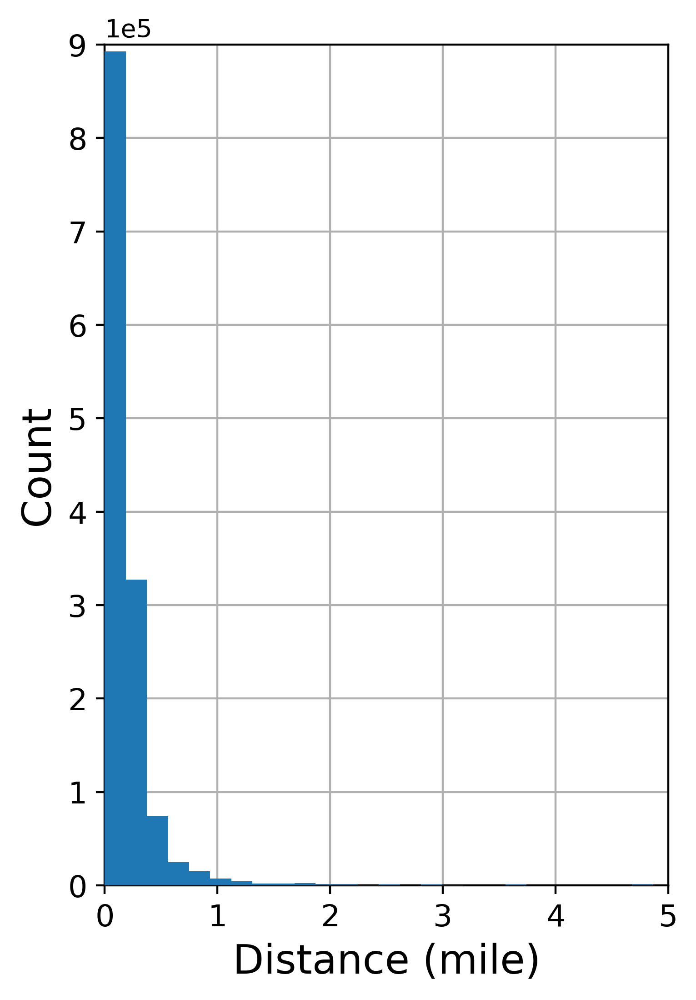

In [79]:
figure(figsize=(4 , 6), dpi=400)
ax=df_copy['dist'].hist(bins=100, zorder=3)
ax.set_xlabel('Distance (mile)', fontsize=16)
ax.set_ylabel('Count', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlim(0,5)
plt.ylim(0,900000)
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
plt.savefig(r'../../figures/hist-trajectories-distance.png', dpi=400, bbox_inches='tight')

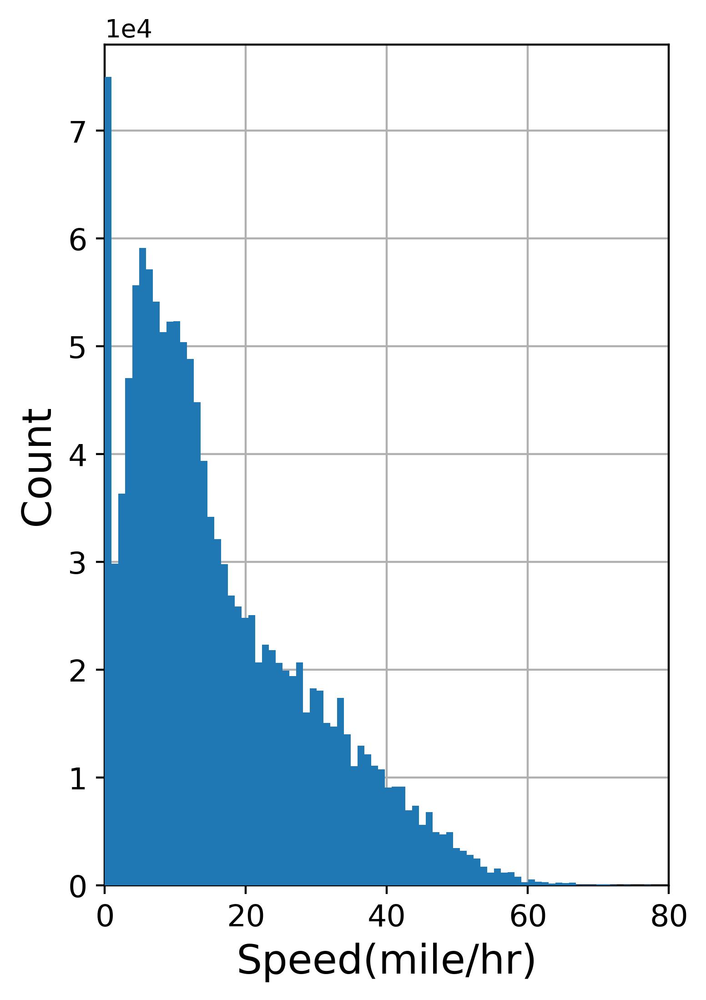

In [80]:
figure(figsize=(4 , 6), dpi=400)
ax=df_copy['speed'].hist(bins=100, zorder=3)
ax.set_xlabel('Speed(mile/hr)', fontsize=16)
ax.set_ylabel('Count', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlim(0,80)
plt.ylim(0,78000)
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
plt.savefig(r'../../figures/hist-trajectories-speed.png', dpi=400, bbox_inches='tight')

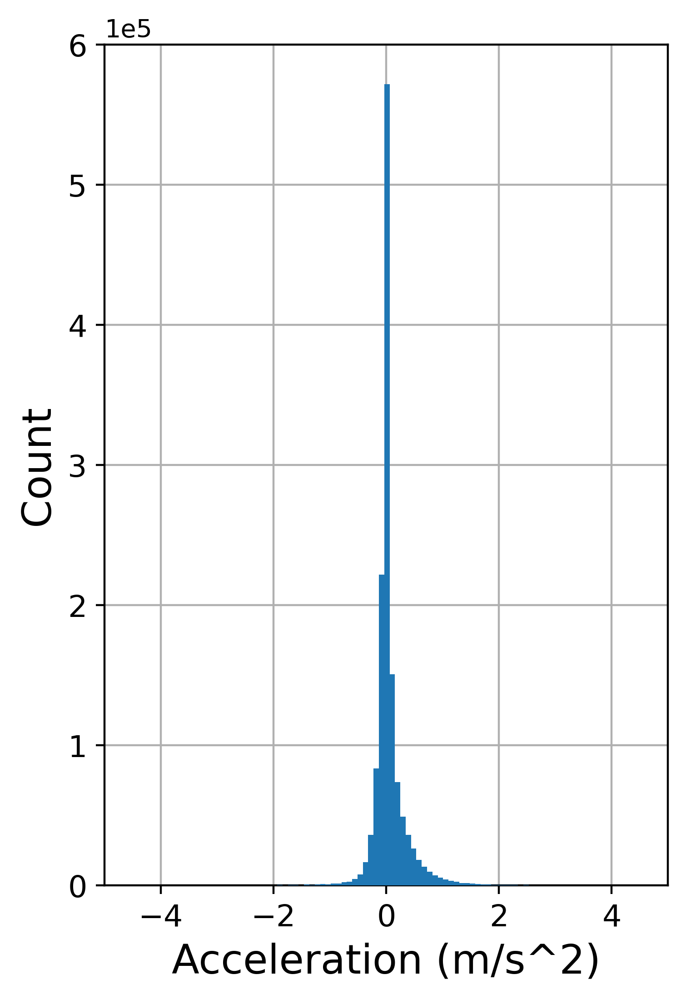

In [81]:
figure(figsize=(4, 6), dpi=400)
ax=df_copy['acc'].hist(bins=100, zorder=3)
ax.set_xlabel('Acceleration (m/s^2)', fontsize=16)
ax.set_ylabel('Count', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlim(-5,5)
plt.ylim(0,600000)
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
plt.savefig(r'../../figures/hist-trajectories-acceleration.png', dpi=400, bbox_inches='tight')

In [82]:
ind_list = [13248, 13249,14215,14216,35589,35590,190041,190042,217628,217629,263794,263795,264966,264967,306983,306984,388110,388111,392564,392565,395360,395361,395477,395478,640284,640285,640286,749057,749058,822527,822528]
df_copy[['ServiceDateTime','Date','Vehicle','dist','speed','acc']].iloc[ind_list]

,ServiceDateTime,Date,Vehicle,dist,speed,acc
13256,2022-04-12 15:04:57,2022-04-12,1412,0.072887,23.853890,0.621677
13257,2022-04-12 15:05:39,2022-04-12,1412,0.136468,11.697265,-0.129393
14224,2022-04-28 15:03:09,2022-04-28,1413,0.136468,11.982564,-0.089424
14225,2022-04-28 15:03:09,2022-04-28,1413,0.000000,0.000000,0.000000
35603,2022-04-13 06:28:08,2022-04-13,1552,0.522519,33.001188,0.116448
35604,2022-04-13 06:29:17,2022-04-13,1552,0.540296,28.189333,-0.031175
190104,2022-04-15 05:15:07,2022-04-15,1652,0.079310,35.689679,0.732855
190105,2022-04-15 05:16:09,2022-04-15,1652,0.246068,14.287840,-0.154314
217708,2022-04-28 11:14:39,2022-04-28,1654,0.332342,33.234249,0.147061
217709,2022-04-28 11:15:28,2022-04-28,1654,0.235301,17.287420,-0.145487


In [83]:
len(df_copy['Route'].unique())

49

In [84]:
len(df_copy['Operator'].unique())

3

In [85]:
df_copy.columns

Index(['ServiceDateTime', 'Unnamed: 0', 'DateKey', 'CalendarDate', 'Year',
       'Month', 'OpKey', 'Operator', 'RtKey', 'RtKey2', 'Route', 'RouteName',
       'TripKey', 'Trip', 'StopKey', 'Stop', 'StopName', 'Lat', 'Lon',
       'Vehicle', 'VehicleType', 'SeatedCap', 'TotalCap', 'Boards', 'Alights',
       'Onboard', 'Bike', 'Wheelchair', 'Weekday', 'Hour', 'Minute', 'Second',
       'Date', 'Daytype', 'time', 'time_delta', 'time_delta_in_seconds',
       'dist', 'speed', 'acc'],
      dtype='object')

In [86]:
len(df_copy['Stop'].unique())

1849

In [87]:
df_copy['Route'].unique()

array(['R44', '(X) 39E', 'B43', '9999', '(X) P11', 'X92', '(X) 821',
       '(X) 804', '(X) 892', '(X) 823', '(X) 801', '(X) 820', 'G5',
       '(X) 802', 'X90', 'B4', 'R14', 'R10', 'G1', 'R29', 'B17', 'G3',
       '(X) 805', '(X) 824', '921', '(X) 803', 'G73', 'P20', 'P21', 'B6',
       'B7', 'G2', 'B12', '(X) 806', '(X) B9', 'B23', 'R24', '31', '30',
       '(X) 38', '33', '46', '45', '35', '(X) 34', 'R41', 'R42', 'B48',
       '(X) 943'], dtype=object)

In [88]:
trajectories = pd.read_csv(r'../../results/computed-trajectories2.csv', delimiter=',', skiprows=0, low_memory=False)

In [89]:
len(trajectories['Vehicle'].unique())

178

In [90]:
trajectories['ServiceDateTime']= pd.to_datetime(trajectories['ServiceDateTime'])

In [91]:
trajectories = trajectories.set_index("ServiceDateTime")
trajectories

,Unnamed: 0.1,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
ServiceDateTime,,,,,,,,,,,,,,,,,,,,,
2022-04-04 06:43:24,0,112564,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,43,24,2022-04-04,Weekday,06:43:24,NaN,NaN,0.000000,0.000000,0.000000
2022-04-04 06:51:27,1,109326,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,51,27,2022-04-04,Weekday,06:51:27,2023-02-13 00:08:03,483.0,0.627342,0.000000,0.000000
2022-04-04 06:51:27,2,112565,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,51,27,2022-04-04,Weekday,06:51:27,2023-02-13 00:00:00,0.0,0.000000,0.000000,0.000000
2022-04-04 06:52:52,3,109327,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,52,52,2022-04-04,Weekday,06:52:52,2023-02-13 00:01:25,85.0,0.313431,13.274729,0.069816
2022-04-04 06:54:33,4,109328,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,54,33,2022-04-04,Weekday,06:54:33,2023-02-13 00:01:41,101.0,0.421734,15.032101,0.007778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-04-30 23:54:20,1361544,1325566,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,54,20,2022-04-30,Weekend,23:54:20,2023-02-13 00:02:20,140.0,0.254140,6.535024,0.003673
2022-04-30 23:55:24,1361545,1325567,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,55,24,2022-04-30,Weekend,23:55:24,2023-02-13 00:01:04,64.0,0.156799,8.819951,0.015960
2022-04-30 23:56:47,1361546,1325568,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,56,47,2022-04-30,Weekend,23:56:47,2023-02-13 00:01:23,83.0,0.144950,6.286980,-0.013643


In [92]:
selected_date=['2022-04-04']
plot_data=trajectories.loc[trajectories.Date.isin(selected_date)]

In [93]:
plot_data

,Unnamed: 0.1,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
ServiceDateTime,,,,,,,,,,,,,,,,,,,,,
2022-04-04 06:43:24,0,112564,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,43,24,2022-04-04,Weekday,06:43:24,NaN,NaN,0.000000,0.000000,0.000000
2022-04-04 06:51:27,1,109326,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,51,27,2022-04-04,Weekday,06:51:27,2023-02-13 00:08:03,483.0,0.627342,0.000000,0.000000
2022-04-04 06:51:27,2,112565,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,51,27,2022-04-04,Weekday,06:51:27,2023-02-13 00:00:00,0.0,0.000000,0.000000,0.000000
2022-04-04 06:52:52,3,109327,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,52,52,2022-04-04,Weekday,06:52:52,2023-02-13 00:01:25,85.0,0.313431,13.274729,0.069816
2022-04-04 06:54:33,4,109328,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,54,33,2022-04-04,Weekday,06:54:33,2023-02-13 00:01:41,101.0,0.421734,15.032101,0.007778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-04-04 19:00:30,1348358,111110,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3515,1001,...,0,30,2022-04-04,Weekday,19:00:30,2023-02-13 00:02:14,134.0,0.219698,5.902347,-0.010855
2022-04-04 19:01:28,1348359,111111,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3515,1001,...,1,28,2022-04-04,Weekday,19:01:28,2023-02-13 00:00:58,58.0,0.208149,12.919584,0.054086
2022-04-04 19:02:59,1348360,111112,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3515,1001,...,2,59,2022-04-04,Weekday,19:02:59,2023-02-13 00:01:31,91.0,0.295510,11.690508,-0.006038


In [94]:
plot_data['Operator'].unique()

array(['VATCo', 'SATCo', 'UMASS'], dtype=object)

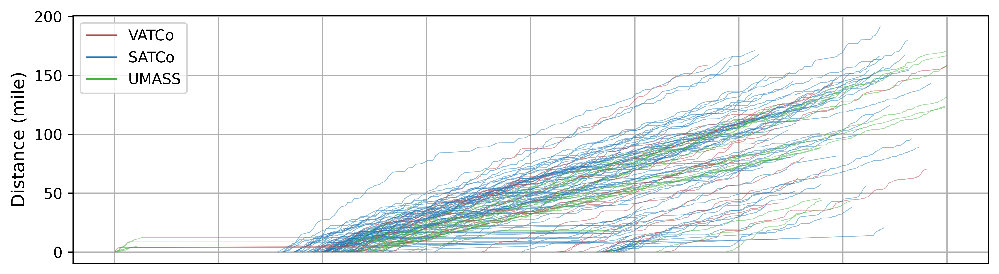

In [95]:
# set size

figure(figsize=(11, 3), dpi=600)

# Plot
vehicle=plot_data['Vehicle'].unique()
for v in vehicle:
    plot_df=plot_data[plot_data['Vehicle']==v]
    operator=plot_df.iloc[1]['Operator']
    if operator=='VATCo':
        plt.plot(plot_df["dist"].cumsum(), marker='', c='#B4464B', linewidth=0.5, alpha=0.5)
    elif operator=='SATCo':
        plt.plot(plot_df["dist"].cumsum(), marker='', c='#1f77b4', linewidth=0.5, alpha=0.5)
    else:
        plt.plot(plot_df["dist"].cumsum(), marker='', c='#4BB446', linewidth=0.5, alpha=0.5)


# Remove x-ticks
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off

# Labelling 
#plt.xlabel("time")
plt.ylabel("Distance (mile)", fontsize=12)
#plt.title("Pandas Time Series Plot")
plt.yticks(fontsize=10)
plt.grid()


# Legend
custom_lines = [Line2D([0], [0], color='#B4464B', lw=1),
                Line2D([0], [0], color='#1f77b4', lw=1),
                Line2D([0], [0], color='#4BB446', lw=1)]
plt.legend(custom_lines, ['VATCo', 'SATCo', 'UMASS'])


# Saving
#plt.savefig(r'../../figures/trajectories-distance.png', dpi=600, bbox_inches='tight')


# Display

plt.show()

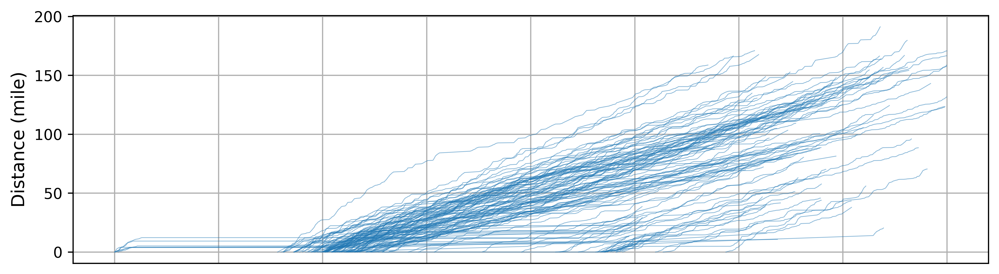

In [96]:
# set size

figure(figsize=(11, 3), dpi=600)

# Plot
vehicle=plot_data['Vehicle'].unique()
for v in vehicle:
    plot_df=plot_data[plot_data['Vehicle']==v]
    plt.plot(plot_df["dist"].cumsum(), marker='', color='#1f77b4', linewidth=0.5, alpha=0.5)


# Remove x-ticks
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off

# Labelling 

#plt.xlabel("time")
plt.ylabel("Distance (mile)", fontsize=12)
#plt.title("Pandas Time Series Plot")
plt.yticks(fontsize=10)
plt.grid()


# Saving
#plt.savefig(r'../../figures/trajectories-distance.png', dpi=600, bbox_inches='tight')


# Display

plt.show()

In [97]:
# set size

figure(figsize=(11, 3), dpi=600)

# Plot
vehicle=plot_data['Vehicle'].unique()
for v in vehicle:
    plot_df=plot_data[plot_data['Vehicle']==v]
    powertrain=plot_df.iloc[1]['Powertrain']
    if powertrain=='conventional':
        plt.plot(plot_df["dist"].cumsum(), marker='', c='#B4464B', linewidth=0.5, alpha=0.5)
    elif powertrain=='hybrid':
        plt.plot(plot_df["dist"].cumsum(), marker='', c='#1f77b4', linewidth=0.5, alpha=0.5)
    else:
        plt.plot(plot_df["dist"].cumsum(), marker='', c='#4BB446', linewidth=0.5, alpha=0.5)


# Remove x-ticks
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off

# Labelling 
#plt.xlabel("time")
plt.ylabel("Distance (mile)", fontsize=12)
#plt.title("Pandas Time Series Plot")
plt.yticks(fontsize=10)
plt.grid()


# Legend
custom_lines = [Line2D([0], [0], color='#B4464B', lw=1),
                Line2D([0], [0], color='#1f77b4', lw=1),
                Line2D([0], [0], color='#4BB446', lw=1)]
plt.legend(custom_lines, ['VATCo', 'SATCo', 'UMASS'])


# Saving
plt.savefig(r'../../figures/trajectories-distance.png', dpi=600, bbox_inches='tight')


# Display

plt.show()

KeyError: 'Powertrain'

<Figure size 6600x1800 with 0 Axes>

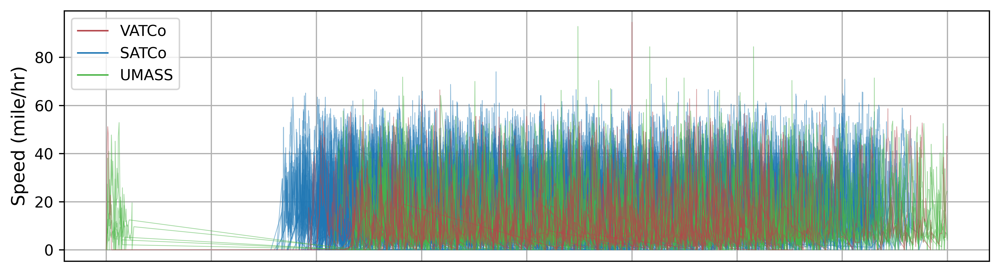

In [114]:
# set size

figure(figsize=(11, 3), dpi=600)

# Plot
vehicle=plot_data['Vehicle'].unique()
for v in vehicle:
    plot_df=plot_data[plot_data['Vehicle']==v]
    operator=plot_df.iloc[1]['Operator']
    if operator=='VATCo':
        plt.plot(plot_df["speed"], marker='',color='#B4464B', linewidth=0.5, alpha=0.5)
    elif operator=='SATCo':
        plt.plot(plot_df["speed"], marker='',color='#1f77b4', linewidth=0.5, alpha=0.5)
    else:
        plt.plot(plot_df["speed"], marker='',color='#4BB446', linewidth=0.5, alpha=0.5)        


# Remove x-ticks
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off

# Labelling 

#plt.xlabel("time")
plt.ylabel("Speed (mile/hr)", fontsize=12)
plt.yticks(fontsize=10)
#plt.title("Pandas Time Series Plot")
plt.grid()

# Legend
custom_lines = [Line2D([0], [0], color='#B4464B', lw=1),
                Line2D([0], [0], color='#1f77b4', lw=1),
                Line2D([0], [0], color='#4BB446', lw=1)]
plt.legend(custom_lines, ['VATCo', 'SATCo', 'UMASS'])

# Saving
plt.savefig(r'../../figures/trajectories-speed.png', dpi=600, bbox_inches='tight')

# Display

plt.show()

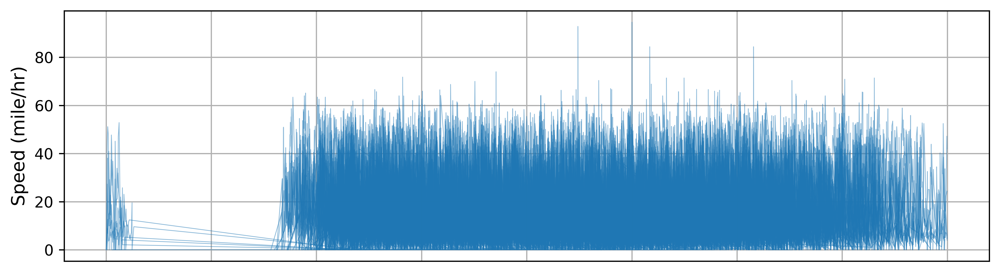

In [118]:
# set size

figure(figsize=(11, 3), dpi=600)

# Plot
vehicle=plot_data['Vehicle'].unique()
for v in vehicle:
    plot_df=plot_data[plot_data['Vehicle']==v]
    plt.plot(plot_df["speed"], marker='',color='#1f77b4', linewidth=0.5, alpha=0.5)



# Remove x-ticks
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off

# Labelling 

#plt.xlabel("time")
plt.ylabel("Speed (mile/hr)", fontsize=12)
plt.yticks(fontsize=10)
#plt.title("Pandas Time Series Plot")
plt.grid()



# Saving
#plt.savefig(r'../../figures/trajectories-speed.png', dpi=600, bbox_inches='tight')

# Display

plt.show()

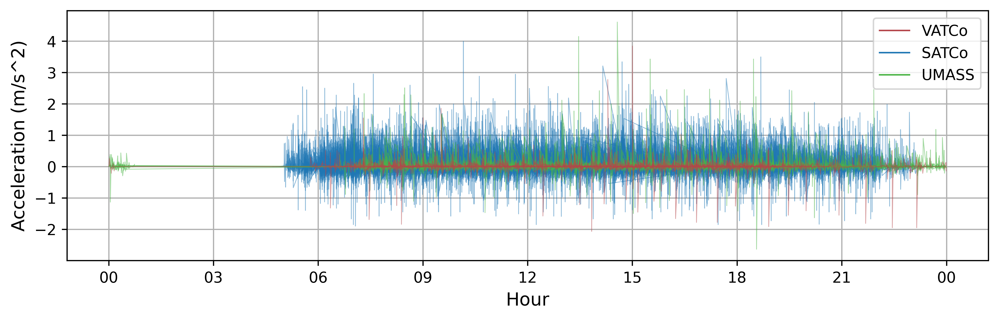

In [119]:
# set size
fig, ax = plt.subplots(figsize=(11, 3), dpi=600)
#figure(figsize=(11, 4), dpi=400)

# Plot
vehicle=plot_data['Vehicle'].unique()
for v in vehicle:
    plot_df=plot_data[plot_data['Vehicle']==v]
    operator=plot_df.iloc[1]['Operator']
    if operator=='VATCo':  
        plt.plot(plot_df["acc"], marker='', color='#B4464B', linewidth=0.5, alpha=0.5)
    elif operator=='SATCo':
        plt.plot(plot_df["acc"], marker='', color='#1f77b4', linewidth=0.5, alpha=0.5)
    else:
        plt.plot(plot_df["acc"], marker='', color='#4BB446', linewidth=0.5, alpha=0.5)


# Labelling 

#plt.xlabel("time")
plt.ylabel("Acceleration (m/s^2)", fontsize=12)
plt.xlabel("Hour", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
#plt.title("Pandas Time Series Plot")
plt.grid()

date_form = DateFormatter("%H")
ax.xaxis.set_major_formatter(date_form)


# Legend
custom_lines = [Line2D([0], [0], color='#B4464B', lw=1),
                Line2D([0], [0], color='#1f77b4', lw=1),
                Line2D([0], [0], color='#4BB446', lw=1)]
plt.legend(custom_lines, ['VATCo', 'SATCo', 'UMASS'])



# Saving
plt.savefig(r'../../figures/trajectories-acceleration.png', dpi=600, bbox_inches='tight')

# Display

plt.show()

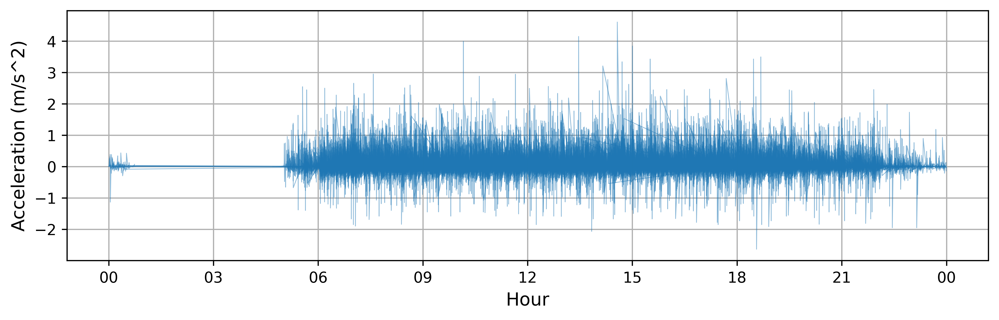

In [120]:
# set size
fig, ax = plt.subplots(figsize=(11, 3), dpi=600)
#figure(figsize=(11, 4), dpi=400)

# Plot
vehicle=plot_data['Vehicle'].unique()
for v in vehicle:
    plot_df=plot_data[plot_data['Vehicle']==v]
    plt.plot(plot_df["acc"], marker='', color='#1f77b4', linewidth=0.5, alpha=0.5)


# Labelling 

#plt.xlabel("time")
plt.ylabel("Acceleration (m/s^2)", fontsize=12)
plt.xlabel("Hour", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
#plt.title("Pandas Time Series Plot")
plt.grid()

date_form = DateFormatter("%H")
ax.xaxis.set_major_formatter(date_form)

# Saving
#plt.savefig(r'../../figures/trajectories-acceleration.png', dpi=600, bbox_inches='tight')

# Display

plt.show()

In [119]:
trajectories=trajectories.reset_index()
trajectories.head()

,ServiceDateTime,Unnamed: 0.1,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
0,2022-04-04 06:43:24,0,112564,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,...,43,24,2022-04-04,Weekday,06:43:24,NaN,NaN,0.000000,0.000000,0.000000
1,2022-04-04 06:51:27,1,109326,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,...,51,27,2022-04-04,Weekday,06:51:27,2022-12-07 00:08:03,483.0,0.627342,0.000000,0.000000
2,2022-04-04 06:51:27,2,112565,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,...,51,27,2022-04-04,Weekday,06:51:27,2022-12-07 00:00:00,0.0,0.000000,0.000000,0.000000
3,2022-04-04 06:52:52,3,109327,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,...,52,52,2022-04-04,Weekday,06:52:52,2022-12-07 00:01:25,85.0,0.313431,13.274729,0.069816
4,2022-04-04 06:54:33,4,109328,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,...,54,33,2022-04-04,Weekday,06:54:33,2022-12-07 00:01:41,101.0,0.421734,15.032101,0.007778


In [120]:
trajectories.sort_values(by=['ServiceDateTime','Vehicle'], ascending=True, inplace=True)

In [121]:
trajectories['Vehicle']

1061662    3303
1346193    7901
1174432    3317
1212942    3322
1212943    3322
           ... 
1245233    3325
1056837    3301
1360786    7902
1031098    3222
1245234    3325
Name: Vehicle, Length: 1360787, dtype: int64

In [122]:
trajectories['time_delta'] = trajectories.groupby(['Vehicle', 'Date'])['ServiceDateTime'].diff()

In [123]:
trajectories['time_delta'].max()

Timedelta('0 days 20:26:36')

In [124]:
trajectories['time_delta'].median()

Timedelta('0 days 00:00:41')

In [125]:
trajectories['time_delta'].min()

Timedelta('0 days 00:00:00')

In [126]:
trajectories['time_delta'].unique()

array([         'NaT',              0,    17000000000, ...,
       12664000000000,  3338000000000, 56031000000000],
      dtype='timedelta64[ns]')

In [351]:
#trajectories.time_delta=trajectories.time_delta.astype(str).str.replace('0 days ', '')

In [352]:
#trajectories['time_delta']= pd.to_datetime(trajectories['time_delta'])

In [353]:
#trajectories['time_delta_in_seconds'] = trajectories['time_delta'].dt.hour * 3600 + trajectories['time_delta'].dt.minute * 60 + trajectories['time_delta'].dt.second

In [354]:
trajectories['time_delta_in_seconds'].unique()

array([       nan, 0.0000e+00, 1.7000e+01, ..., 1.2664e+04, 3.3380e+03,
       5.6031e+04])

In [355]:
trajectories.head()

,ServiceDateTime,Unnamed: 0.1,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
1061897,2022-04-01 00:00:00,1062086,46929,8760,2022-04-01 00:00:00.000,2022,4,3,UMASS,3505,...,0,0,2022-04-01,Weekday,00:00:00,NaT,NaN,0.0,0.0,0.0
1346649,2022-04-01 00:00:08,1346943,2437,8760,2022-04-01 00:00:00.000,2022,4,1,VATCo,3515,...,0,8,2022-04-01,Weekday,00:00:08,NaT,NaN,0.0,0.0,0.0
1174744,2022-04-01 00:00:12,1174966,46955,8760,2022-04-01 00:00:00.000,2022,4,3,UMASS,3505,...,0,12,2022-04-01,Weekday,00:00:12,NaT,NaN,0.0,0.0,0.0
1213270,2022-04-01 00:00:18,1213526,48367,8760,2022-04-01 00:00:00.000,2022,4,3,UMASS,3508,...,0,18,2022-04-01,Weekday,00:00:18,NaT,NaN,0.0,0.0,0.0
1213271,2022-04-01 00:00:18,1213527,50425,8760,2022-04-01 00:00:00.000,2022,4,3,UMASS,3508,...,0,18,2022-04-01,Weekday,00:00:18,0 days,0.0,0.0,0.0,0.0


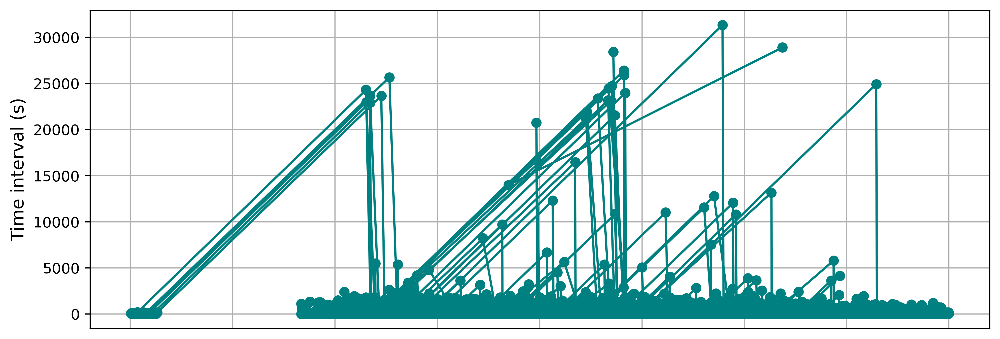

In [312]:
# set size

figure(figsize=(11, 4), dpi=400)

# Plot
vehicle=plot_data['Vehicle'].unique()
for v in vehicle:
    plot_df=plot_data[plot_data['Vehicle']==v]
    plt.plot(plot_df["time_delta_in_seconds"], marker='o', color='teal')



# Remove x-ticks
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off

# Labelling 

#plt.xlabel("time")
plt.ylabel("Time interval (s)", fontsize=12)
plt.yticks(fontsize=10)
#plt.title("Pandas Time Series Plot")
plt.grid()

# Saving
plt.savefig(r'../../figures/time-intervals.png', dpi=400, bbox_inches='tight')

# Display

plt.show()

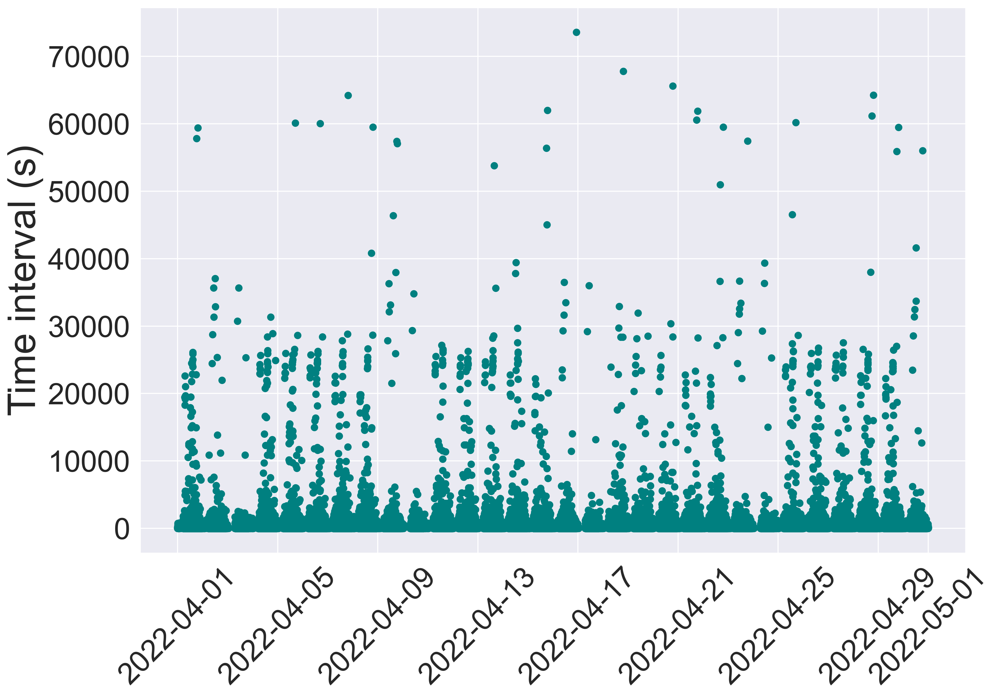

In [258]:
figure(figsize=(14, 9.5), dpi=300)
plt.plot_date(x=trajectories['ServiceDateTime']  , y=trajectories["time_delta_in_seconds"], fmt='o', tz=None, xdate=True, ydate=False, color='teal')
plt.ylabel("Time interval (s)", fontsize=36)
plt.xticks(fontsize=28, rotation = 45)
plt.yticks(fontsize=28)
#plt.savefig(r'../../figures/time-intervals.png', dpi=400, bbox_inches='tight')
plt.show()

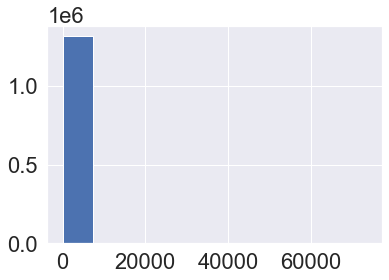

In [259]:
df_time_intervals = trajectories[trajectories['time_delta_in_seconds'] > 0]
plt.hist(df_time_intervals['time_delta_in_seconds'])
#plt.savefig(r'../../figures/hist-time-intervals.png', dpi=400, bbox_inches='tight')
plt.show()

In [356]:
len(df['Route'].unique())

49

In [357]:
#trajectories.to_csv(r'../../results/computed-trajectories-v02.csv')

In [358]:
df_acc = trajectories.sort_values('acc', ascending=False)
df_acc['acc']

1285352    20.1168
1353878    20.1168
1344102    20.1168
1342310    20.1168
1310230    20.1168
            ...   
1204528        NaN
1204529        NaN
1346261        NaN
1346262        NaN
1346263        NaN
Name: acc, Length: 1361253, dtype: float64

In [359]:
df_dist = trajectories.sort_values('dist', ascending=False)
df_dist['dist']

58278      18.700636
34202      15.433128
73737      15.433128
83983      15.433128
108408     15.433128
             ...    
1164119          NaN
1204527          NaN
1204528          NaN
1346261          NaN
1346262          NaN
Name: dist, Length: 1361253, dtype: float64

In [360]:
df_speed = trajectories.sort_values('speed', ascending=False)
df_speed['speed'].head(50000)

217603     90.000000
1062061    90.000000
1071328    90.000000
1335575    90.000000
1319291    90.000000
             ...    
618838     44.449289
386628     44.449289
82227      44.449289
310644     44.449289
68014      44.449289
Name: speed, Length: 50000, dtype: float64

In [361]:
trajectories['dist'].max()

18.700636389473715

In [362]:
trajectories['dist'].median()

0.1395764902777601

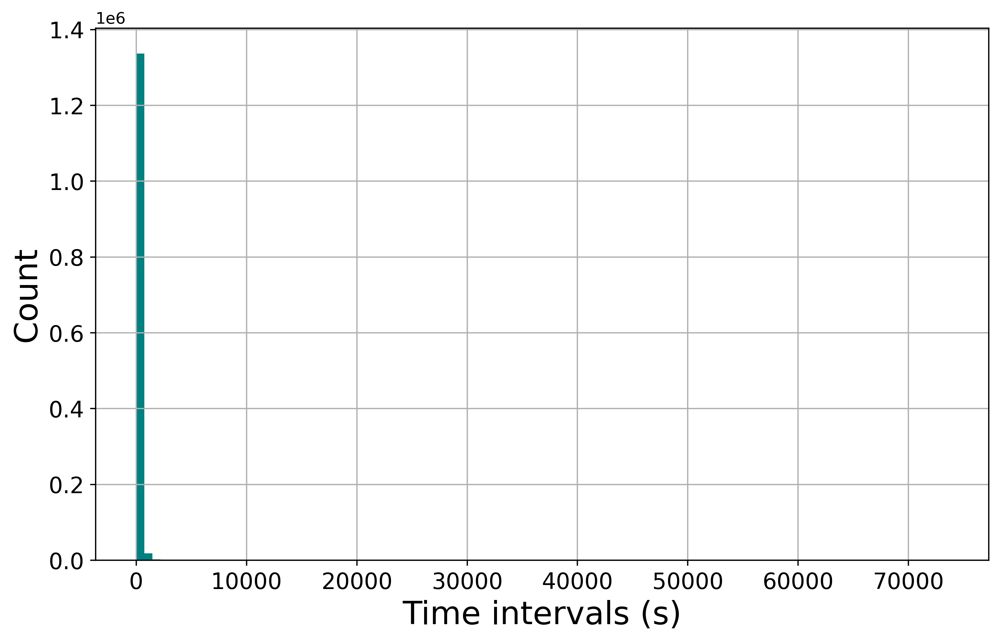

In [157]:
figure(figsize=(10, 6), dpi=400)
ax=trajectories['time_delta_in_seconds'].hist(bins=100, color='teal')
ax.set_xlabel('Time intervals (s)', fontsize=20)
ax.set_ylabel('Count', fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.savefig(r'../../figures/hist-time-intervals.png', dpi=400, bbox_inches='tight')

In [363]:
trajectories['time_delta_in_seconds'].max()

73596.0

In [364]:
trajectories['time_delta_in_seconds'].median()

41.0

In [365]:
trajectories['time_delta_in_seconds'].mean()

93.3055875431833

In [366]:
df_dist_outliers=trajectories[trajectories['dist']>15]

In [367]:
df_dist_outliers

,ServiceDateTime,Unnamed: 0.1,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
108408,2022-04-01 17:51:03,108414,43654,8760,2022-04-01 00:00:00.000,2022,4,2,SATCo,3630,...,51,3,2022-04-01,Weekday,17:51:03,0 days 00:27:41,1661.0,15.433128,33.449285,0.009003
73737,2022-04-04 17:50:27,73742,152939,8763,2022-04-04 00:00:00.000,2022,4,2,SATCo,3630,...,50,27,2022-04-04,Weekday,17:50:27,0 days 00:27:32,1652.0,15.433128,33.631514,0.009101
34202,2022-04-05 17:53:05,34204,206300,8764,2022-04-05 00:00:00.000,2022,4,2,SATCo,3630,...,53,5,2022-04-05,Weekday,17:53:05,0 days 00:29:39,1779.0,15.433128,31.230614,0.007848
83983,2022-04-08 06:35:13,83989,366354,8767,2022-04-08 00:00:00.000,2022,4,2,SATCo,3620,...,35,13,2022-04-08,Weekday,06:35:13,0 days 00:52:32,3152.0,15.433128,17.626669,0.002500
84383,2022-04-08 17:52:24,84389,366875,8767,2022-04-08 00:00:00.000,2022,4,2,SATCo,3630,...,52,24,2022-04-08,Weekday,17:52:24,0 days 00:28:08,1688.0,15.433128,32.914255,0.008717
129890,2022-04-11 08:52:46,129899,469666,8770,2022-04-11 00:00:00.000,2022,4,2,SATCo,3655,...,52,46,2022-04-11,Weekday,08:52:46,0 days 00:39:09,2349.0,15.433123,23.652296,0.003014
111680,2022-04-11 17:55:02,111686,437762,8770,2022-04-11 00:00:00.000,2022,4,2,SATCo,3631,...,55,2,2022-04-11,Weekday,17:55:02,0 days 00:30:25,1825.0,15.433123,30.443421,0.007457
325328,2022-04-12 06:30:46,325383,529847,8771,2022-04-12 00:00:00.000,2022,4,2,SATCo,3664,...,30,46,2022-04-12,Weekday,06:30:46,0 days 00:52:52,3172.0,15.433123,17.515524,0.002469
388723,2022-04-12 06:38:18,388784,491128,8771,2022-04-12 00:00:00.000,2022,4,2,SATCo,3631,...,38,18,2022-04-12,Weekday,06:38:18,0 days 00:42:46,2566.0,15.433123,21.652082,0.003772
381236,2022-04-13 06:37:44,381295,544246,8772,2022-04-13 00:00:00.000,2022,4,2,SATCo,3631,...,37,44,2022-04-13,Weekday,06:37:44,0 days 00:39:28,2368.0,15.433123,23.462518,0.004429


In [368]:
df_time_intervals_outliers=trajectories[trajectories['time_delta_in_seconds']>50000]

In [369]:
df_time_intervals_outliers

,ServiceDateTime,Unnamed: 0.1,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
1334079,2022-04-01 18:14:07,1334372,1944,8760,2022-04-01 00:00:00.000,2022,4,1,VATCo,3515,...,14,7,2022-04-01,Weekday,18:14:07,0 days 16:03:31,57811.0,0.947721,0.059016,-2.678156e-06
1346777,2022-04-01 19:24:26,1347071,21,8760,2022-04-01 00:00:00.000,2022,4,1,VATCo,3410,...,24,26,2022-04-01,Weekday,19:24:26,0 days 16:30:07,59407.0,0.631421,0.038263,2.879336e-07
1307420,2022-04-05 16:49:19,1307711,163144,8764,2022-04-05 00:00:00.000,2022,4,1,VATCo,3410,...,49,19,2022-04-05,Weekday,16:49:19,0 days 16:41:46,60106.0,0.631544,0.037826,2.813304e-07
1307661,2022-04-06 16:50:01,1307952,216585,8765,2022-04-06 00:00:00.000,2022,4,1,VATCo,3410,...,50,1,2022-04-06,Weekday,16:50:01,0 days 16:40:56,60056.0,0.631544,0.037857,2.817990e-07
1348822,2022-04-07 19:25:06,1349116,269361,8766,2022-04-07 00:00:00.000,2022,4,1,VATCo,3410,...,25,6,2022-04-07,Weekday,19:25:06,0 days 17:50:33,64233.0,0.625590,0.035062,-6.645816e-05
1349118,2022-04-08 19:24:57,1349412,323256,8767,2022-04-08 00:00:00.000,2022,4,1,VATCo,3410,...,24,57,2022-04-08,Weekday,19:24:57,0 days 16:32:00,59520.0,0.625590,0.037838,-6.213933e-05
1185775,2022-04-09 18:11:21,1186001,411711,8768,2022-04-09 00:00:00.000,2022,4,3,UMASS,3622,...,11,21,2022-04-09,Weekend,18:11:21,0 days 15:56:34,57394.0,0.599712,0.037617,2.929942e-07
1349402,2022-04-09 18:37:44,1349696,380420,8768,2022-04-09 00:00:00.000,2022,4,1,VATCo,3519,...,37,44,2022-04-09,Weekend,18:37:44,0 days 15:50:55,57055.0,0.627342,0.039583,-2.930769e-06
1124970,2022-04-13 15:42:18,1125185,587700,8772,2022-04-13 00:00:00.000,2022,4,3,UMASS,3624,...,42,18,2022-04-13,Weekday,15:42:18,0 days 14:56:22,53782.0,0.000000,0.000000,0.000000e+00
1357940,2022-04-15 17:50:30,1358234,646219,8774,2022-04-15 00:00:00.000,2022,4,1,VATCo,3410,...,50,30,2022-04-15,Weekday,17:50:30,0 days 15:40:00,56400.0,0.631544,0.040311,-5.179991e-06


In [370]:
#df[['ServiceDateTime','Date','Vehicle','dist','speed','acc']][(df['Vehicle'] == 1642) & (df['Date'] == '2022-04-04') ]

In [372]:
trajectories[['ServiceDateTime','Date','Vehicle','dist','speed','acc']][(trajectories['Vehicle'] == 1642) & (trajectories['Date'] == '2022-04-04') ]

,ServiceDateTime,Date,Vehicle,dist,speed,acc
151609,2022-04-04 07:14:26,2022-04-04,1642,0.000000,0.000000,0.000000
151610,2022-04-04 07:15:25,2022-04-04,1642,0.268592,16.388644,0.124176
151611,2022-04-04 07:16:27,2022-04-04,1642,0.310223,18.012945,0.011712
151612,2022-04-04 07:17:20,2022-04-04,1642,0.147543,10.021773,-0.067403
151613,2022-04-04 07:18:14,2022-04-04,1642,0.181551,12.103388,0.017233
151614,2022-04-04 07:19:42,2022-04-04,1642,0.474900,19.427711,0.037208
151615,2022-04-04 07:19:56,2022-04-04,1642,0.100140,25.750371,0.201892
151616,2022-04-04 07:20:43,2022-04-04,1642,0.110635,8.474147,-0.164323
151617,2022-04-04 07:21:22,2022-04-04,1642,0.154770,14.286429,0.066624
151618,2022-04-04 07:21:43,2022-04-04,1642,0.121848,20.888281,0.140538


In [386]:
trajectories[['ServiceDateTime','Date','Vehicle','dist','speed','acc']][(trajectories['Vehicle'] == 1729) & (trajectories['Date'] == '2022-04-19') ]

,ServiceDateTime,Date,Vehicle,dist,speed,acc
486099,2022-04-19 05:49:19,2022-04-19,1729,0.0,0.0,0.0


In [374]:
nans=trajectories[trajectories['dist'].isna()]

In [375]:
nans[['ServiceDateTime','Date','Vehicle','Lon','Lat','dist','speed','acc']]
#nans[['ServiceDateTime','Date','Vehicle','dist','speed','acc']][(nans['Vehicle'] == 1642) & (trajectories['Date'] == '2022-04-04') ]

,ServiceDateTime,Date,Vehicle,Lon,Lat,dist,speed,acc
1093701,2022-04-01 07:01:50,2022-04-01,3307,-72.533010,42.393760,NaN,NaN,NaN
1021510,2022-04-01 07:20:09,2022-04-01,3222,-72.533010,42.393760,NaN,NaN,NaN
1078703,2022-04-01 07:24:38,2022-04-01,3305,NaN,NaN,NaN,NaN,NaN
1078704,2022-04-01 07:31:01,2022-04-01,3305,-72.532480,42.405880,NaN,NaN,NaN
1268208,2022-04-01 13:00:52,2022-04-01,7552,-72.633052,42.317699,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
1164119,2022-04-29 07:15:45,2022-04-29,3313,-72.533010,42.393760,NaN,NaN,NaN
1204527,2022-04-29 08:24:42,2022-04-29,3319,NaN,NaN,NaN,NaN,NaN
1204528,2022-04-29 08:28:34,2022-04-29,3319,-72.533010,42.393760,NaN,NaN,NaN
1346261,2022-04-29 14:00:00,2022-04-29,7816,NaN,NaN,NaN,NaN,NaN


In [376]:
df[df['dist'].isna()]

,ServiceDateTime,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
1015375,2022-04-12 09:08:42,530273,8771,2022-04-12 00:00:00.000,2022,4,3,UMASS,3391,1732,...,8,42,2022-04-12,Weekday,09:08:42,2022-12-04 00:00:41,41.0,NaN,NaN,NaN
1016670,2022-04-23 10:45:48,1038647,8782,2022-04-23 00:00:00.000,2022,4,3,UMASS,3709,1732,...,45,48,2022-04-23,Weekend,10:45:48,2022-12-04 00:09:21,561.0,NaN,NaN,NaN
1017014,2022-04-24 10:43:48,1056369,8783,2022-04-24 00:00:00.000,2022,4,3,UMASS,3709,1732,...,43,48,2022-04-24,Weekend,10:43:48,2022-12-04 00:10:13,613.0,NaN,NaN,NaN
1017911,2022-04-26 09:08:18,1160410,8785,2022-04-26 00:00:00.000,2022,4,3,UMASS,3709,1732,...,8,18,2022-04-26,Weekday,09:08:18,2022-12-04 02:31:43,9103.0,NaN,NaN,NaN
1020514,2022-04-15 07:27:11,687917,8774,2022-04-15 00:00:00.000,2022,4,3,UMASS,3391,1732,...,27,11,2022-04-15,Weekday,07:27:11,2022-12-04 00:04:44,284.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1342414,2022-04-11 14:00:34,434847,8770,2022-04-11 00:00:00.000,2022,4,1,VATCo,3515,1001,...,0,34,2022-04-11,Weekday,14:00:34,2022-12-04 00:02:34,154.0,NaN,NaN,NaN
1345596,2022-04-23 16:00:45,1003542,8782,2022-04-23 00:00:00.000,2022,4,1,VATCo,3516,1002,...,0,45,2022-04-23,Weekend,16:00:45,2022-12-04 00:00:45,45.0,NaN,NaN,NaN
1345659,2022-04-24 09:07:09,1038714,8783,2022-04-24 00:00:00.000,2022,4,1,VATCo,3515,1001,...,7,9,2022-04-24,Weekend,09:07:09,2022-12-04 00:03:09,189.0,NaN,NaN,NaN
1346555,2022-04-29 14:00:00,1271377,8788,2022-04-29 00:00:00.000,2022,4,1,VATCo,3516,1002,...,0,0,2022-04-29,Weekday,14:00:00,2022-12-04 00:04:00,240.0,NaN,NaN,NaN


In [377]:
df['Vehicle'][df['dist'].isna()].unique()

array([3212, 3221, 3222, 3225, 3228, 3301, 3302, 3303, 3305, 3306, 3307,
       3311, 3312, 3313, 3314, 3316, 3317, 3318, 3319, 3322, 3324, 3402,
       3501, 7552, 7610, 7660, 7661, 7662, 7802, 7811, 7813, 7814, 7815,
       7816], dtype=int64)

In [163]:
df[df['Lat'].isna()]

,ServiceDateTime,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
1015374,2022-04-12 09:08:01,530272,8771,2022-04-12 00:00:00.000,2022,4,3,UMASS,3391,1732,...,8,1,2022-04-12,Weekday,09:08:01,NaT,NaN,0.0,0.0,0.0
1016669,2022-04-23 10:36:27,1038646,8782,2022-04-23 00:00:00.000,2022,4,3,UMASS,3709,1732,...,36,27,2022-04-23,Weekend,10:36:27,NaT,NaN,0.0,0.0,0.0
1017013,2022-04-24 10:33:35,1056368,8783,2022-04-24 00:00:00.000,2022,4,3,UMASS,3709,1732,...,33,35,2022-04-24,Weekend,10:33:35,NaT,NaN,0.0,0.0,0.0
1017910,2022-04-26 06:36:35,1160371,8785,2022-04-26 00:00:00.000,2022,4,3,UMASS,3709,1732,...,36,35,2022-04-26,Weekday,06:36:35,NaT,NaN,0.0,0.0,0.0
1020513,2022-04-15 07:22:27,687916,8774,2022-04-15 00:00:00.000,2022,4,3,UMASS,3391,1732,...,22,27,2022-04-15,Weekday,07:22:27,NaT,NaN,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1342413,2022-04-11 13:58:00,434846,8770,2022-04-11 00:00:00.000,2022,4,1,VATCo,3515,1001,...,58,0,2022-04-11,Weekday,13:58:00,NaT,NaN,0.0,0.0,0.0
1345595,2022-04-23 16:00:00,1003541,8782,2022-04-23 00:00:00.000,2022,4,1,VATCo,3516,1002,...,0,0,2022-04-23,Weekend,16:00:00,NaT,NaN,0.0,0.0,0.0
1345658,2022-04-24 09:04:00,1038713,8783,2022-04-24 00:00:00.000,2022,4,1,VATCo,3515,1001,...,4,0,2022-04-24,Weekend,09:04:00,NaT,NaN,0.0,0.0,0.0
1346554,2022-04-29 13:56:00,1271375,8788,2022-04-29 00:00:00.000,2022,4,1,VATCo,3516,1002,...,56,0,2022-04-29,Weekday,13:56:00,NaT,NaN,0.0,0.0,0.0


In [164]:
df[df['Lon'].isna()]

,ServiceDateTime,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
1015374,2022-04-12 09:08:01,530272,8771,2022-04-12 00:00:00.000,2022,4,3,UMASS,3391,1732,...,8,1,2022-04-12,Weekday,09:08:01,NaT,NaN,0.0,0.0,0.0
1016669,2022-04-23 10:36:27,1038646,8782,2022-04-23 00:00:00.000,2022,4,3,UMASS,3709,1732,...,36,27,2022-04-23,Weekend,10:36:27,NaT,NaN,0.0,0.0,0.0
1017013,2022-04-24 10:33:35,1056368,8783,2022-04-24 00:00:00.000,2022,4,3,UMASS,3709,1732,...,33,35,2022-04-24,Weekend,10:33:35,NaT,NaN,0.0,0.0,0.0
1017910,2022-04-26 06:36:35,1160371,8785,2022-04-26 00:00:00.000,2022,4,3,UMASS,3709,1732,...,36,35,2022-04-26,Weekday,06:36:35,NaT,NaN,0.0,0.0,0.0
1020513,2022-04-15 07:22:27,687916,8774,2022-04-15 00:00:00.000,2022,4,3,UMASS,3391,1732,...,22,27,2022-04-15,Weekday,07:22:27,NaT,NaN,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1342413,2022-04-11 13:58:00,434846,8770,2022-04-11 00:00:00.000,2022,4,1,VATCo,3515,1001,...,58,0,2022-04-11,Weekday,13:58:00,NaT,NaN,0.0,0.0,0.0
1345595,2022-04-23 16:00:00,1003541,8782,2022-04-23 00:00:00.000,2022,4,1,VATCo,3516,1002,...,0,0,2022-04-23,Weekend,16:00:00,NaT,NaN,0.0,0.0,0.0
1345658,2022-04-24 09:04:00,1038713,8783,2022-04-24 00:00:00.000,2022,4,1,VATCo,3515,1001,...,4,0,2022-04-24,Weekend,09:04:00,NaT,NaN,0.0,0.0,0.0
1346554,2022-04-29 13:56:00,1271375,8788,2022-04-29 00:00:00.000,2022,4,1,VATCo,3516,1002,...,56,0,2022-04-29,Weekday,13:56:00,NaT,NaN,0.0,0.0,0.0


In [378]:
less_tan_two_seconds=trajectories[trajectories['time_delta_in_seconds']<2]

In [379]:
less_tan_two_seconds[less_tan_two_seconds['dist']>0]

,ServiceDateTime,Unnamed: 0.1,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc


In [380]:
bad_points=df[df['time_delta_in_seconds']< 2]

In [382]:
trajectories[['ServiceDateTime','Date','Vehicle','dist','speed','acc']][(trajectories['Vehicle'] == 7902 & (trajectories['Date'] == '2022-04-08'))]

,ServiceDateTime,Date,Vehicle,dist,speed,acc


In [383]:
trajectories[['ServiceDateTime','Date','Vehicle','dist','speed','acc']][(trajectories['Vehicle'] == 3303)]

,ServiceDateTime,Date,Vehicle,dist,speed,acc
1061897,2022-04-01 00:00:00,2022-04-01,3303,0.000000,0.000000,0.000000
1061898,2022-04-01 00:01:11,2022-04-01,3303,0.159006,8.062252,0.050763
1061899,2022-04-01 00:05:27,2022-04-01,3303,0.253337,3.562557,-0.007858
1061900,2022-04-01 00:06:13,2022-04-01,3303,0.072114,5.643678,0.020225
1061901,2022-04-01 00:07:43,2022-04-01,3303,0.067056,2.682246,-0.014710
...,...,...,...,...,...,...
1074872,2022-04-29 20:49:24,2022-04-29,3303,0.307753,11.913031,0.034135
1074873,2022-04-29 20:50:11,2022-04-29,3303,0.204431,15.658522,0.035625
1074874,2022-04-29 20:50:49,2022-04-29,3303,0.094113,8.915984,-0.079321
1074875,2022-04-29 20:50:49,2022-04-29,3303,0.000000,0.000000,0.000000


In [484]:
trajectories[['ServiceDateTime','Date','Vehicle','dist','speed','acc']][(trajectories['Vehicle'] == 7902) & (trajectories['Date'] == '2022-04-11') ]

,ServiceDateTime,Date,Vehicle,dist,speed,acc
1357079,2022-04-11 10:25:49,2022-04-11,7902,0.000000,0.000000,0.000000
1357080,2022-04-11 10:34:00,2022-04-11,7902,0.000000,0.000000,0.000000
1357081,2022-04-11 10:36:17,2022-04-11,7902,0.631544,16.595308,0.054152
1357082,2022-04-11 10:36:17,2022-04-11,7902,0.000000,0.000000,0.000000
1357083,2022-04-11 10:39:29,2022-04-11,7902,0.313431,5.876833,0.013683
...,...,...,...,...,...,...
1357311,2022-04-11 18:11:36,2022-04-11,7902,0.203997,22.949681,0.042521
1357312,2022-04-11 18:13:37,2022-04-11,7902,0.249247,7.415607,-0.057391
1357313,2022-04-11 18:17:36,2022-04-11,7902,0.219698,3.309266,-0.007681
1357314,2022-04-11 18:19:04,2022-04-11,7902,0.208149,8.515180,0.026446


In [489]:
trajectories['dist'][(trajectories['Vehicle'] == 7902) & (trajectories['Date'] == '2022-04-13')].sum()

87.46669297702144